# Рынок заведений общественного питания Москвы

Цель данного исследования - анализ рынка заведений общественного питания Москвы для определения наиболее востребованной, привлекательной и прибыльной ниши открытия собственного заведения.

Для целей данного исследования планируется выполнить следующие задачи:

1. [Обзор данных.](#start) (общая информация о данных, наличие пропусков)
2. [Предобработка данных.](#first) (проверка на наличие явных и неявных дубликатов, создание дополнительных столбцов, необходимых для дальнейших расчётов, наличие аномальных значений)
3. [Анализ данных:](#analysis) <br>
   3.1 [Обзор категорий заведений и их долей на рынке.](#category) (какими категориями представлены заведения, каково их распределение)<br>
   3.2 [Обзор вместимости заведений.](#size) (количество посадочных мест в заведениях в зависимости от категории заведения)<br>
   3.3 [Обзор сетевых заведений.](#chain) (соотношение сетевых и несетевых заведений, наиболее популярные сети, категории присутствия сетевых заведений) <br>
   3.4 [Распределение заведений общественного питания по округам города.](#district) <br>
   3.5 [Обзор рейтинга заведений: рейтинг по категориям заведений и по округам города.](#rating) <br>
   3.6 [Георгафическое расположение заведений общественного питания:](#geo) [топ-15 улиц по количеству заведений,\
       распределение заведений по самым популярным улицам,](#topstreet) [самые непопулярные улицы города.](#nonpop) <br>
   3.7 [Обзор цен в заведениях общественного питания - средний чек по округам города.](#bill) <br>
   3.8 [Выводы.](#finding)<br>
4. [Анализ выбранной ниши - открытие кофейни:](#coffee) <br>
   4.1 [Количество кофеен и распределение по округам города.](#count) <br>
   4.2 [Режим работы кофеен.](#hours) <br>
   4.3 [Средний рейтинг кофеен по округам города.](#avgrating) <br>
   4.4 [Обзор цен - средняя цена чашки кофе по округам.](#avgbill) <br>
5. [Предложения по открытию заведения.](#conclusion)

<a id="start"></a> 
## 1. Обзор данных

Импортируем необходимые библиотеки и откроем датасет.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
import json
import folium
import warnings
warnings.filterwarnings('ignore')

In [2]:
from fuzzywuzzy import fuzz
from fuzzywuzzy import process

In [3]:
path = 'C:/Users/Azerty/Downloads/moscow_places.csv'

In [4]:
try:
    rests = pd.read_csv(path + 'moscow_places.csv')
except:
    rests = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

Изучим основную информацию о данных.

In [5]:
rests.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [6]:
rests.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Вывод.<br>
Первоначальный обзор данных показал, что датасет содержит информацию о 8406 заведениях Москвы. <br>
Данные содержат пропуски в некоторых столбцах. <br>
Вряд ли получится заполнить пропуски адекватными данными.**

<a id="first"></a> 
## 2. Предобработка данных

Проверим датасет на наличие дубликатов.

In [7]:
rests.duplicated().sum()

0

Явные дубликаты отстутствуют.

Проверим датасет на наличие неявных дубликатов.

In [8]:
duplicaterows = rests[rests\
.duplicated(['name', 'lat', 'lng'])]
display(duplicaterows)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Приведём все названия к нижнему регистру.

In [9]:
rests['name'] = rests['name'].str.lower()

Попробуем ещё раз поискать невные дубликаты.

In [10]:
duplicaterows = rests[rests\
.duplicated(['name', 'lat', 'lng'])]
display(duplicaterows)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


Теперь обнаружился один неявный дубликат. Удалим его.

In [11]:
rests = rests.drop(index=1511)

Создадим столбец с названиями улиц для последующего анализа.

In [12]:
rests['street'] = [x.split(', ')[1] for x in rests['address'].values]
rests.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [13]:
rests['street'].unique()

array(['улица Дыбенко', 'Клязьминская улица', 'улица Маршала Федоренко',
       ..., 'улица Хлобыстова', 'Новороссийская улица',
       'Чонгарский бульвар'], dtype=object)

Создадим столбец 'is_24_7', чтобы видеть, какие заведения работают круглосуточно 7 дней в неделю.

In [14]:
def hours(row):
    hours = row['hours']
    if hours == 'ежедневно, круглосуточно':
        return 'True'
    return 'False'
    
rests['is_24_7'] = rests.apply(hours, axis=1)

In [15]:
rests.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [16]:
rests.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8405.000000,8405.000000,8405.000000,3149.000000,535.000000,8405.000000,4794.000000
mean,55.750102,37.608584,4.229899,958.053668,174.721495,0.381202,108.405090
std,0.069659,0.098595,0.470376,1009.732845,88.951103,0.485711,122.840831
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538626,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753407,37.605260,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795033,37.664793,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


В датасете явно присутствуют аномальные значения. <br>
Например, заведения с количеством посадочных мест, равным нулю (возможно, там едят стоя :)) или 1288 мест (просто огромнеое заведение). <br>
Также настораживает заведение с нулевым средним чеком. <br>
Посмотрим, что это за заведения.

In [17]:
rests[rests['seats'] == 0]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
84,meat doner kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,Средний счёт:300 ₽,300.0,NaN,0,0.0,улица Лескова,True
177,арамье,булочная,"Москва, улица 800-летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,NaN,NaN,NaN,NaN,1,0.0,улица 800-летия Москвы,False
196,донер-шашлык,ресторан,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,NaN,NaN,NaN,NaN,0,0.0,улица Лескова,True
203,тандыр № 1,кафе,"Москва, улица Лескова, 22Г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.895615,37.611049,4.0,NaN,NaN,NaN,NaN,1,0.0,улица Лескова,True
211,неаполитан пицца,кафе,"Москва, улица Пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.885416,37.604650,4.3,NaN,NaN,NaN,NaN,0,0.0,улица Пришвина,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8118,бико,булочная,"Москва, улица Симоновский Вал, 13, стр. 3",Юго-Восточный административный округ,"ежедневно, 08:00–20:00",55.723340,37.664252,1.3,NaN,NaN,NaN,NaN,0,0.0,улица Симоновский Вал,False
8168,чайхана уч кудук,кофейня,"Москва, улица Симоновский Вал, 26, корп. 1",Южный административный округ,"ежедневно, 09:00–00:00",55.718663,37.662887,4.3,NaN,NaN,NaN,NaN,0,0.0,улица Симоновский Вал,False
8172,масса кофе,кофейня,"Москва, Холодильный переулок, 2",Южный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–20:00",55.709713,37.624388,4.3,средние,Цена чашки капучино:100–210 ₽,NaN,155.0,0,0.0,Холодильный переулок,False
8336,сочная шаурма в кузьминках,быстрое питание,"Москва, Волгоградский проспект, 102",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.703834,37.773831,3.9,NaN,Средний счёт:120–130 ₽,125.0,NaN,0,0.0,Волгоградский проспект,True


Вполне вероятно, что в этих заведениях действительно нет посадочных мест и они работают исключительно на вынос.

In [18]:
rests[rests['seats'] > 500]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
1326,нам,"бар,паб","Москва, Ленинградский проспект, 69, стр. 1",Северный административный округ,"ежедневно, 11:00–21:00",55.803236,37.517898,4.2,NaN,NaN,NaN,NaN,1,625.0,Ленинградский проспект,False
1351,максима пицца,пиццерия,"Москва, Ленинградский проспект, 78, корп. 1",Северный административный округ,"пн-пт 09:00–00:00; сб,вс 10:00–00:00",55.805807,37.513994,4.3,выше среднего,Средний счёт:1500–1800 ₽,1650.0,NaN,0,625.0,Ленинградский проспект,False
1355,страдивари,ресторан,"Москва, Ленинградский проспект, 77, корп. 1",Северный административный округ,"ежедневно, 11:00–23:00",55.804980,37.509454,4.2,выше среднего,Средний счёт:1000–2000 ₽,1500.0,NaN,1,625.0,Ленинградский проспект,False
1367,академия,пиццерия,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,"пн-пт 09:00–23:00; сб,вс 11:00–23:00",55.805579,37.520086,4.2,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,1,625.0,Ленинградский проспект,False
1380,север-метрополь,кофейня,"Москва, Ленинградский проспект, 75, корп. 1",Северный административный округ,"ежедневно, 09:00–21:00",55.804940,37.512423,4.6,NaN,NaN,NaN,NaN,1,625.0,Ленинградский проспект,False
1385,чайхона на соколе,кафе,"Москва, Ленинградский проспект, 69, стр. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.803236,37.517931,4.3,средние,Средний счёт:400–800 ₽,600.0,NaN,0,625.0,Ленинградский проспект,False
1393,кулинарная лавка братьев караваевых,кафе,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.805791,37.520339,4.3,NaN,Средний счёт:500–800 ₽,650.0,NaN,1,625.0,Ленинградский проспект,False
1442,abc coffee roasters,кофейня,"Москва, Ленинградский проспект, 72, корп. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.805547,37.520395,4.5,средние,Цена чашки капучино:220–270 ₽,NaN,245.0,0,625.0,Ленинградский проспект,False
1446,9 bar coffee,кофейня,"Москва, Ленинградский проспект, 80, корп. 1",Северный административный округ,"пн-пт 07:30–21:00; сб,вс 07:30–19:00",55.810352,37.506625,4.3,NaN,Цена чашки капучино:60–150 ₽,NaN,105.0,1,625.0,Ленинградский проспект,False
1464,находка,ресторан,"Москва, Ленинградский проспект, 74, корп. 1",Северный административный округ,"ежедневно, 09:00–22:00",55.804972,37.517319,4.9,NaN,NaN,NaN,NaN,1,625.0,Ленинградский проспект,False


Сложно себе представить заведения с количеством посадочных мест более 500.

Заменим аномальные значения на пропуски.

In [19]:
rests.loc[(rests.seats > 500), 'seats'] = np.nan


In [20]:
rests[rests['seats'] > 500]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7


In [21]:
rests[rests['middle_avg_bill'] == 0]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3688,кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,NaN,1,200.0,улица Новый Арбат,True


Вряд ли в этой кофейне выдают кофе бесплатно. <br>
Либо здесь не ведут статистику среднего чека, либо заведение только открылось и ещё не успело принять своих посетителей.<br>
В пользу обеих версий говорит и отсутствие информации о средней цене за чашку кофе.

**Вывод. <br>
В ходе предварительной обработки данных явных дуликатов не обнаружено. <br>
Обнаружен и удалён один неявный дубликат. <br>
В ходе предварительного анализа данных обнаружены аномальные значения в столбцах seats и middle_avg_bill. <br>
В столбце seats их достаточно много, это модет повлиять на дальнейшие результаты исследования. <br>
Стоит учесть это при дальнейших расчётах.<br>
Также отметим, что часть адресов в датасете заполнена некорректно - не указана улица. Не самое высокое качество исходных данных**

<a id="analysis"></a> 
## 3. Анализ данных

Проведём анализ рынка заведений общественного питания.

<a id="category"></a> 
### 3.1 Обзор категорий заведений и их долей на рынке.

Рассмотрим, какие категории заведений встречаются в исследовании и в каком соотношении распределяются.

In [22]:
rests_caty = rests.groupby('category', as_index = False)[['name']].count().sort_values(by='name', ascending=False)
rests_caty

,category,name
3,кафе,2378
6,ресторан,2042
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


In [23]:
fig = px.bar(rests_caty.sort_values(by='name', ascending=True),
             x='name', 
             y='category',
             text='name'
            )

fig.update_layout(title='Распределение заведений по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория заведения')
fig.show()

Больше всего заведения общепита представлены в категориях кафе и ресторан. Достаточно большое количество кофеен.

<a id="size"></a> 
### 3.2 Обзор вместимости заведений.

Рассчитаем медианное значение количества посадочных мест в заведениях различных категорий.

In [24]:
rests_seats = rests.groupby('category', as_index = False)[['seats']].median().sort_values(by='seats', ascending=False)
rests_seats['seats'] = round(rests_seats['seats'], 0)
rests_seats 

,category,seats
6,ресторан,86.0
0,"бар,паб",80.0
4,кофейня,78.0
7,столовая,75.0
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,52.0
1,булочная,50.0


In [25]:
fig = px.bar(rests_seats, x='category', y='seats', text='seats')
fig.update_layout(title='Количество посадочных мест по категориям заведений',
                   xaxis_title='Категория заведения',
                   yaxis_title='Количество посадочных мест')
fig.show() 

Самыми большими по количеству посадочных мест являются рестораны, бары и пабы, кофейни и столовые.<br>
Рестораны и столовые, вероятно, рассчитаны на большое количество мест для проведения банкетов. <br>
Бары и пабы часто проводят трансляции спортивных мероприятий, привлекающих множество посетителей. <br>
Кофейни, вероятно, рассчитывают на большое количество посетителей на завтраки и ланчи. <br>
Странным выглядит иедианное значение количества мест в булочных. Кажется, 50 - это слишком много для такой категории заведения. Необходима проверка исходных данных на корректность.

<a id="chain"></a> 
### 3.3 Обзор сетевых заведений.

Рассмотрим, в каком соотношении распределены сетевые и несетевые заведения.

In [26]:
rests_chain = rests.pivot_table(index='chain', values='name', aggfunc='count')
rests_chain.columns = ['rest_cnt']
#print(rests_chain)
rests_chain.index = ['несетевые', 'сетевые']
rests_chain

,rest_cnt
несетевые,5201
сетевые,3204


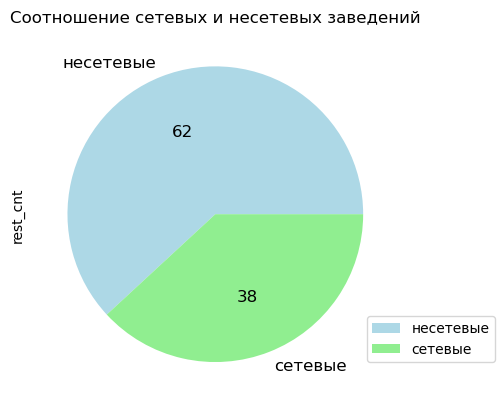

In [27]:
rests_chain.plot(kind='pie', y='rest_cnt', colors=['lightblue', 'lightgreen'], autopct = '%.0f', textprops=dict(color='black', fontsize=12))
plt.legend(loc=(0.91, 0.1))
plt.title('Соотношение сетевых и несетевых заведений');

Сетевых заведений существенно меньше, чем несетевых.

Посмотрим, какие категории чаще всего встречаются среди сетевых заведений.

In [28]:
chain_rests = rests[rests['chain'] == 1]

In [29]:
ch_caty = chain_rests.groupby('category', as_index = False)[['name']].count().sort_values(by='name', ascending=False)
ch_caty

,category,name
3,кафе,779
6,ресторан,729
4,кофейня,720
5,пиццерия,330
2,быстрое питание,232
0,"бар,паб",169
1,булочная,157
7,столовая,88


In [30]:
ch_rests_caty = rests_caty.merge(ch_caty, on='category', how='left')
ch_rests_caty.columns = ['category', 'total_cnt', 'chain_cnt']
ch_rests_caty['part'] = round(ch_rests_caty['chain_cnt'] / ch_rests_caty['total_cnt'] * 100, 0)
ch_rests_caty = ch_rests_caty.sort_values(by='part', ascending=False)

In [31]:
fig = px.bar(ch_rests_caty, x='category', y='part', text='part')
fig.update_layout(title='Доля сетевых заведений по категориям',
                   xaxis_title='Категория заведения',
                   yaxis_title='Доля')
fig.show() 

Булочные в основном представлены сетевыми заведениями, более 60%.<br>
Пиццерии и кофейни представлены сетевыми заведениями более, чем наполовину. <br>
Менее всего сетевых заведений среди баров, пабов.

Узнаем, какие самые популярные сети находятся в Москве (имеют больше всего заведений).

In [32]:
top_chains_2 = chain_rests.groupby('name', as_index = False)[['lat']].count().sort_values(by='lat', ascending=False).head(15)
top_chains_2

,name,lat
729,шоколадница,120
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,71
742,яндекс лавка,69
58,cofix,65
168,prime,50
664,хинкальная,44
409,кофепорт,42
418,кулинарная лавка братьев караваевых,39


In [33]:
fig = px.bar(top_chains_2.sort_values(by='lat', ascending=True),
             x='lat', 
             y='name',
             text='lat'
            )

fig.update_layout(title='ТОП-15 сетей общественного питания Москвы',
                   xaxis_title='Количество заведений',
                   yaxis_title='Наименование сети')
fig.show()

Самая популярная сеть - Шоколадница. <br>
Также очень популярны Домино'с пицца, додо пицца, one price coffee, яндекс лавка и cofix.

Посмотрим, как распределяются самые популярные сети по категориям.

In [34]:
list_top_chains = top_chains_2['name'].unique()
top_chain_rests = rests[rests['name'].isin(list_top_chains)]
top_chain_rests_cnt = top_chain_rests['name'].count()

In [35]:
top_ch_cat = top_chain_rests.groupby('category', as_index = False)[['name']].count().sort_values(by='name', ascending=False)
top_ch_cat['part'] = round(top_ch_cat['name'] / top_chain_rests_cnt * 100, 2)
top_ch_cat

,category,name,part
4,кофейня,337,41.20
6,ресторан,186,22.74
5,пиццерия,152,18.58
3,кафе,100,12.22
1,булочная,25,3.06
2,быстрое питание,12,1.47
0,"бар,паб",4,0.49
7,столовая,2,0.24


In [36]:
fig = px.bar(top_ch_cat, x='category', y='part', text='part')
fig.update_layout(title='Доля категорий популярных сетей',
                   xaxis_title='Категория заведения',
                   yaxis_title='Доля')
fig.show() 

Больше всего популярных сетевых заведений в категории кофейня. <br>
Также достаточно много сетевых заведений среди ресторанов и пиццерий.

<a id="district"></a> 
### 3.4 Распределение заведений по округам города.

Посмотрим, какие округа представлены в исследовании, и как заведения общественного питания распределены по этим округам.

In [37]:
rests['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Для удобства сократим названия окургов.

In [38]:
def districts(row):
    district = row['district']
    if district == 'Северный административный округ':
        return 'САО'
    if district == 'Северо-Восточный административный округ':
        return 'СВАО'
    if district == 'Северо-Западный административный округ':
        return 'СЗАО'
    if district == 'Западный административный округ':
        return 'ЗАО'
    if district == 'Центральный административный округ':
        return 'ЦАО'
    if district == 'Восточный административный округ':
        return 'ВАО'
    if district == 'Юго-Восточный административный округ':
        return 'ЮВАО'
    if district == 'Южный административный округ':
        return 'ЮАО'
    if district == 'Юго-Западный административный округ':
        return 'ЮЗАО'
        
rests['dist'] = rests.apply(districts, axis=1)

In [39]:
data_dist_cat = rests.groupby(['dist', 'category'], \
                        as_index = False)[['name']].count()
data_dist_cat

,dist,category,name
0,ВАО,"бар,паб",53
1,ВАО,булочная,25
2,ВАО,быстрое питание,71
3,ВАО,кафе,272
4,ВАО,кофейня,105
...,...,...,...
67,ЮЗАО,кафе,238
68,ЮЗАО,кофейня,96
69,ЮЗАО,пиццерия,64
70,ЮЗАО,ресторан,168


In [40]:
fig  =  px.bar(data_dist_cat.sort_values(by='name', ascending=True),  x = 'name',  y = 'dist',  color = 'category') 
fig.update_layout(title='Распределение заведений по округам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Округ',
                   legend_title='Категории заведений')

fig.update_yaxes(categoryorder='total ascending')

fig.show()

Так как в Центральном округе намного больше заведений, чем в других округах, для более объективной оценки рассмотрим распределение заведений по округам не в количественном, а в процентном соотношении.

In [41]:
part_dist = rests.groupby(['dist', 'category'], \
                        as_index = False)[['name']].count()
part_dist['pct_total'] = round(part_dist['name']/part_dist.groupby('dist')['name'].transform('sum') * 100, 1)
part_dist

,dist,category,name,pct_total
0,ВАО,"бар,паб",53,6.6
1,ВАО,булочная,25,3.1
2,ВАО,быстрое питание,71,8.9
3,ВАО,кафе,272,34.1
4,ВАО,кофейня,105,13.2
...,...,...,...,...
67,ЮЗАО,кафе,238,33.6
68,ЮЗАО,кофейня,96,13.5
69,ЮЗАО,пиццерия,64,9.0
70,ЮЗАО,ресторан,168,23.7


In [42]:
fig  =  px.bar(part_dist.sort_values(by='name', ascending=True),  x = 'pct_total',  y = 'dist',  color = 'category', text='pct_total') 
fig.update_layout(title='Распределение заведений по округам',
                   xaxis_title='Доли заведений по категориям',
                   yaxis_title='Округ',
                   legend_title='Категории заведений')

fig.show()

Больше всего заведений в Центральном округе. При этом чаще всего в данном округе встречаются рестораны.<br>
Также здесь много кафе, кофеен и баров. <br>
Во всех остальных округах явным преимуществом обладают кафе.

<a id="rating"></a> 
### 3.5 Обзор рейтинга заведений.

Рассчитаем средний рейтинг по категориям заведений.

In [43]:
rests_rating = rests.groupby('category', as_index = False)[['rating']].mean()
rests_rating['rating'] = round(rests_rating['rating'], 2)
rests_rating

,category,rating
0,"бар,паб",4.39
1,булочная,4.27
2,быстрое питание,4.05
3,кафе,4.12
4,кофейня,4.28
5,пиццерия,4.30
6,ресторан,4.29
7,столовая,4.21


In [44]:
fig = px.bar(rests_rating.sort_values(by='rating', ascending=True),
             x='rating', 
             y='category',
             text='rating'
            )

fig.update_layout(title='Средний рейтинг заведений по категориям в Москве',
                   xaxis_title='Средний рейтинг',
                   yaxis_title='Категория заведения')
fig.show()

Чтобы лучше рассмотреть разницу в рейтингах, поменяем масштаб графика.

In [45]:
fig = px.bar(rests_rating.sort_values(by='rating', ascending=True),
             x='rating', 
             y='category',
             text='rating')
fig.update_xaxes(range=[4, 4.4])

fig.update_layout(title='Средний рейтинг заведений по категориям в Москве',
                   xaxis_title='Средний рейтинг',
                   yaxis_title='Категория заведения')
fig.show()

Средний рейтинг заведений по категорям не сильно отличаетсяю Заметно проигрывает только категория быстрое питание. <br>
Можно сделать вывод, что рейтинг заведения не зависит от категории, а только от своих характеристик.

Рассмотрим зависисмость рейтинга заведений от географического расположения.

Рассчитаем средний рейтинг заведений по округам.

In [46]:
rests_dist_rating = rests.pivot_table(index='district', values='rating', aggfunc='mean')
rests_dist_rating.columns = ['dist_mean_rating']
rests_dist_rating

,dist_mean_rating
district,
Восточный административный округ,4.174185
Западный административный округ,4.181551
Северный административный округ,4.239822
Северо-Восточный административный округ,4.148260
Северо-Западный административный округ,4.208802
Центральный административный округ,4.377520
Юго-Восточный административный округ,4.101120
Юго-Западный административный округ,4.172920
Южный административный округ,4.184417


Посмотрим, как рейтинг распределяется по карте города.

In [47]:
from folium import Map, Choropleth

try:
    with open('C:/Users/Azerty/Downloads/admin_level_geomap.geojson', encoding='utf-8') as fh:
        state_geo = json.load(fh)
except:

    with open('/datasets/admin_level_geomap.geojson', encoding='utf-8') as fh:
            state_geo = json.load(fh)

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=rests_dist_rating,
    columns=[rests_dist_rating.index, 'dist_mean_rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

Заведения с самым высоким рейтингом находятся в Центральном округе. Также достаточно высокий рейтинг у заведений Северного округа.

<a id="geo"></a> 
### 3.6 Географическое расположение заведений.

Посмотрим, как распределяются заведения общественного питания по карте города.

In [48]:
from folium import Map, Marker

from folium.plugins import MarkerCluster

l = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(l)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

rests.apply(create_clusters, axis=1)

l

По карте видно, что наибольшая концентрация заведений - в Центральном округе.

<a id="topstreet"></a> Узнаем названия 15 самых популярных улиц по количеству заведений общественного питания, открытых на них.

In [49]:
top_15 = rests.groupby('street', as_index = False)[['name']].count().sort_values(by='name', ascending=False).head(15)
top_15

,street,name
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [50]:
list_of_streets = top_15['street'].unique()
list_of_streets

array(['проспект Мира', 'Профсоюзная улица', 'проспект Вернадского',
       'Ленинский проспект', 'Ленинградский проспект',
       'Дмитровское шоссе', 'Каширское шоссе', 'Варшавское шоссе',
       'Ленинградское шоссе', 'МКАД', 'Люблинская улица',
       'улица Вавилова', 'Кутузовский проспект', 'улица Миклухо-Маклая',
       'Пятницкая улица'], dtype=object)

In [51]:
top_15_streets = rests[rests['street'].isin(list_of_streets)]

Посмотрим, какие категории заведений встречаются на самых популярных улицах.

In [52]:
data_str_cat = top_15_streets.groupby(['street', 'category'], \
                        as_index = False)[['name']].count()
data_str_cat

,street,category,name
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
...,...,...,...
106,улица Миклухо-Маклая,быстрое питание,4
107,улица Миклухо-Маклая,кафе,21
108,улица Миклухо-Маклая,кофейня,4
109,улица Миклухо-Маклая,пиццерия,2


In [53]:
fig  =  px.bar(data_str_cat.sort_values(by='name', ascending=True), x = 'name',  y = 'street',  color = 'category') 
fig.update_layout(title='Топ-15 улиц Москвы по количеству заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улицы',
                   legend_title='Категории заведений')
fig.update_yaxes(categoryorder='total ascending')
fig.show()

На большинстве популярных улиц чаще всего встречаются кафе. <br>
Также часто встречаются рестораны. На неоторых улицах расположено много кофеен. <br>
Стоит отметить, что на количество заведений на улицах города влияет не только и не столько длина улицы, сколько её расположение. <br>
Значение имеют близость к центру и достопримечательностям города, местам культуры и отдыха, офисным и бизнес центрам, крупным торговым центрам и другим точкам притяжения жителей и гостей города.

<a id="nonpop"></a> Узнаем, на каких улицах меньше всего заведений - по одному.

In [54]:
rests_street = rests.groupby('street', as_index = False)[['name']].count()
one_rest_street = rests_street[rests_street['name'] == 1]
one_rest_street

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


In [55]:
list_of_one_rest_street = one_rest_street['street'].unique()
list_of_one_rest_street

array(['1-й Автозаводский проезд', '1-й Балтийский переулок',
       '1-й Варшавский проезд', '1-й Вешняковский проезд',
       '1-й Голутвинский переулок', '1-й Грайвороновский проезд',
       '1-й Дербеневский переулок', '1-й Земельный переулок',
       '1-й Капотнинский проезд', '1-й Кирпичный переулок',
       '1-й Колобовский переулок', '1-й Котляковский переулок',
       '1-й Курьяновский проезд', '1-й Николощеповский переулок',
       '1-й Новокузнецкий переулок', '1-й Рижский переулок',
       '1-й Самотёчный переулок', '1-й Сетуньский проезд',
       '1-й Спасоналивковский переулок', '1-й Щипковский переулок',
       '1-я Боевская улица', '1-я Курьяновская улица',
       '1-я Парковая улица', '1-я Стекольная улица',
       '1-я Фрунзенская улица', '1-я Ямская улица',
       '1-я линия Хорошёвского Серебряного Бора', '11-я Парковая улица',
       '12-я Парковая улица', '14-я Парковая улица',
       '16-я Парковая улица', '17-й проезд Марьиной Рощи',
       '2-й Балтийский переу

In [56]:
non_pop_streets = rests[rests['street'].isin(list_of_one_rest_street)]

In [57]:
non_pop_streets['name'].count()

458

In [58]:
non_pop_cat = non_pop_streets.groupby('category', as_index = False)[['name']].count()
non_pop_cat

,category,name
0,"бар,паб",39
1,булочная,8
2,быстрое питание,23
3,кафе,160
4,кофейня,84
5,пиццерия,15
6,ресторан,93
7,столовая,36


In [59]:
c = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
marker_cluster = MarkerCluster().add_to(c)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

non_pop_streets.apply(create_clusters, axis=1)

c

Если рассмотреть места расположений заведений, которые находятся по одному на улице, окажется, что на самом деле эти заведения расположены вдоль крупных улиц, просто адреса зданиям, в которых они расположены, даны по более мелким улочкам.

<a id="bill"></a> Посмотрим, каков средний чек заведений по округам города. 

In [60]:
rests_dist_bill = rests.pivot_table(index='district', values='middle_avg_bill', aggfunc='median')
rests_dist_bill.columns = ['dist_median_bill']
rests_dist_bill

,dist_median_bill
district,
Восточный административный округ,575.0
Западный административный округ,1000.0
Северный административный округ,650.0
Северо-Восточный административный округ,500.0
Северо-Западный административный округ,700.0
Центральный административный округ,1000.0
Юго-Восточный административный округ,450.0
Юго-Западный административный округ,600.0
Южный административный округ,500.0


In [61]:
b = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=rests_dist_bill,
    columns=[rests_dist_bill.index, 'dist_median_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(b)

b

In [62]:
rests_cat_bill = rests.pivot_table(index='category', values='middle_avg_bill', aggfunc='median')
rests_cat_bill.columns = ['cat_median_bill']
rests_cat_bill.sort_values(by='cat_median_bill', ascending=False)

,cat_median_bill
category,
"бар,паб",1250.0
ресторан,1250.0
пиццерия,600.0
кафе,550.0
булочная,450.0
кофейня,400.0
быстрое питание,375.0
столовая,300.0


Самые высокие цены в заведениях общественного питания Центраьного и Западного районов Москвы. Эти районы считаются самыми престижными и характеризуются самыми всокими ценами на недвижимость, что также отражается и на ценах на товары и услуги в этих районах.<br>
Кроме того, стоит отметить, что на высокий средний чек в Центральном округе влияет бОльшее количество ресторанов и баров, средний чек которых являтся самым высоким по категориям заведений. 

Самые низкие цены наблюдаются в Южном, Юго-Восточном и Северо-Восточном районах.

Попробуем найти другие зависимости.

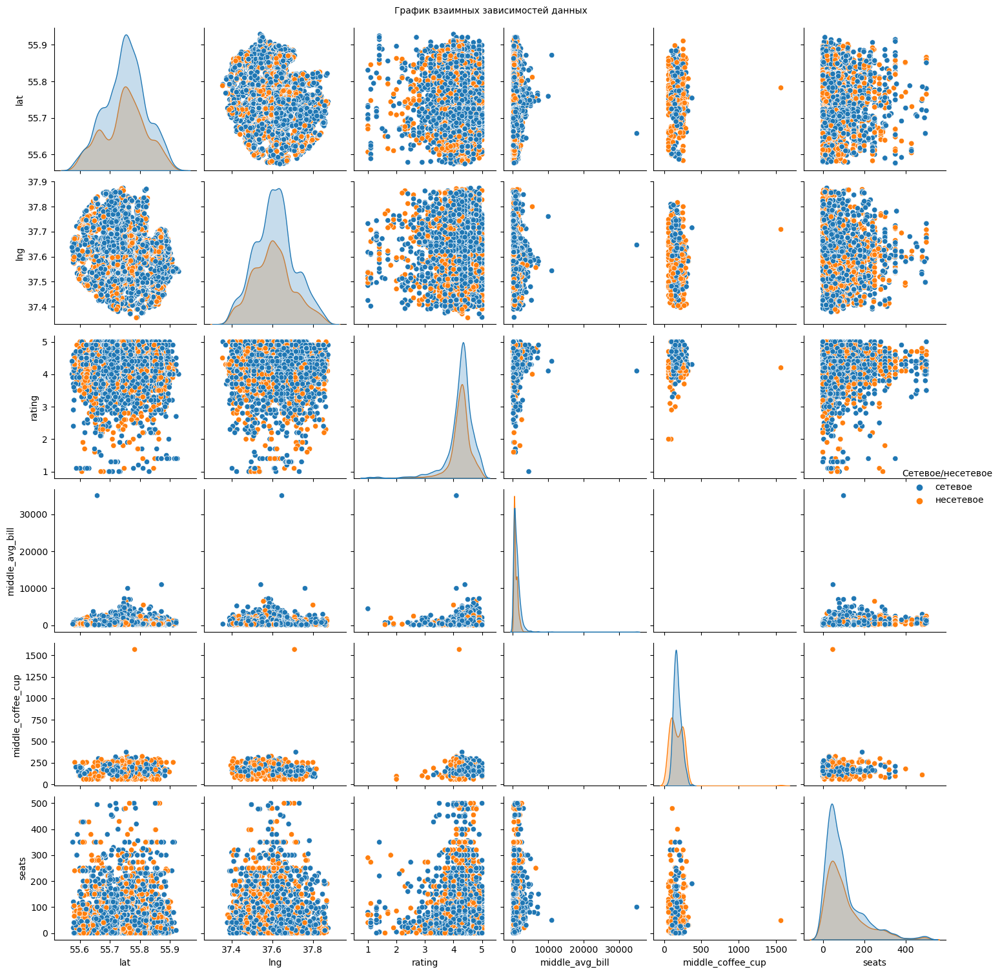

In [63]:
g = sns.pairplot(rests, hue='chain')
plt.figtext(0.4, 1, 'График взаимных зависимостей данных')

for ax in g.axes.flat:
    leg = g.axes.flat[0].get_legend()
    if not leg is None: break
# or legend may be on a figure
if leg is None: leg = g._legend

# change legend texts
new_title = 'Сетевое/несетевое'
leg.set_title(new_title)
new_labels = ['сетевое', 'несетевое']
for t, l in zip(leg.texts, new_labels):
    t.set_text(l)
    


По данным этогго графика можно сказать, что рейтинг заведений не зависит от расположения и достаточно равномерно распределяется по широте и долготе. <br>
Средний чек выше в центре города, в районе станции метро Арбатская. <br>
Низкий рейтинг более характерен для маленьких заведений с небольшим количеством посадочных мест и низким средним чеком. <br>
При этом стоит отметить, что распределение зависисмостей не зависит от принадлежности заведения к сети.

<a id="finding"></a>
### 3.8 Выводы 

**Самыми популярными категорями заведений (по количеству в городе) являются кафе, рестораны и кофейни. <br>
Самыми вместительными являются рестораны, бары, столовые и кофейни. <br>
Большую часть составляют несетевые заведения. <br>
Среди сетевых заведений преобладают кафе, рестораны и кофейни. <br>
Больше всего заведений сосредоточено в Центральном округе. Там расположены, в основном, рестораны, кафе, кофейни и бары. <br>
Средний рейтинг заведений практически не отличается по округам (кроме Центрального) и не сильно отличается по категориям. <br>
Самый высокий рейтинг у баров и пабов, самый низкий - у ресторанов быстрого питания. <br>
Самые популярные улицы по размещению заведений - крупные центральные артерии города, близкие к точкам притяжения людей - тороговым и культурным центрам, достопримечательностям, офисным и бизнес центрам. <br>
На этих улицах чаще всего встречаются кафе, рестораны и кофейни. <br>
Самый высокий срений чек в Центральном и Западном округах. Высокий средний чек Центрального округа видимо обусловлен большим количеством баров, так как эта категория заведений имеет самый высокий средний чек. <br>
Кроме того, можно отметить, что низкий рейтинг более характерен для небольших заведений. <br>
Также можно отметить, что принадлежность к сети, не влияет на показатели заведения**

<a id="coffee"></a> 
## 4. Детализация исследования - открытие кофейни

<a id="count"></a> Посчитаем количество кофеен в представленном датасете.

In [64]:
coffee = rests[rests['category'] == 'кофейня']
cnt = coffee['name'].count()
print('В представленном датасете', cnt, 'кофеен')

В представленном датасете 1413 кофеен


In [65]:
coffee.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1413 entries, 3 to 8400
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1398 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   int64  
 13  seats              739 non-null    float64
 14  street             1413 non-null   object 
 15  is_24_7            1413 non-null   object 
 16  dist               1413 non-n

In [66]:
coffee.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,1413.000000,1413.000000,1413.000000,200.000000,521.000000,1413.000000,739.000000
mean,55.756130,37.599649,4.277282,614.210000,175.055662,0.509554,100.433018
std,0.064374,0.089454,0.372250,501.083154,89.753009,0.500086,90.991761
min,55.581907,37.371261,1.400000,0.000000,60.000000,0.000000,0.000000
25%,55.719992,37.537096,4.100000,300.000000,124.000000,0.000000,40.000000
50%,55.759599,37.599096,4.300000,400.000000,170.000000,1.000000,78.000000
75%,55.796430,37.655903,4.400000,750.000000,225.000000,1.000000,140.000000
max,55.920257,37.864105,5.000000,2500.000000,1568.000000,1.000000,500.000000


Рассмотрим распределение кофеен по округам города.

In [67]:
coffee_dist = coffee.pivot_table(index='district', values='name', aggfunc='count')
coffee_dist.columns = ['coffee_cnt']
coffee_dist

,coffee_cnt
district,
Восточный административный округ,105
Западный административный округ,150
Северный административный округ,193
Северо-Восточный административный округ,159
Северо-Западный административный округ,62
Центральный административный округ,428
Юго-Восточный административный округ,89
Юго-Западный административный округ,96
Южный административный округ,131


In [68]:
cf = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=state_geo,
    data=coffee_dist,
    columns=[coffee_dist.index, 'coffee_cnt'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Распределение кофеен по районам',
).add_to(cf)

marker_cluster = MarkerCluster().add_to(cf)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffee.apply(create_clusters, axis=1)

cf

Больше всего кофеен расположено в Центральном округе. Там расположены основные достопримечательности и прогулочные зоны. <br>
Также немало кофеен расположено в Северном округе. Предположу, что там расположено много офисных комплексов, сотрудники которых завтракают и берут кофе с собой в кофейнях.

<a id="hours"></a> Посмотрим, какие режимы работы встречаются в кофейнях. 

In [69]:
coffee['hours'].unique()

array(['ежедневно, 09:00–22:00', 'ежедневно, 10:00–21:00',
       'пн-пт 08:00–18:00', 'пн-пт 09:00–19:00', 'ежедневно, 08:00–22:00',
       'ежедневно, 10:00–22:00', 'ежедневно, 09:00–21:00',
       'пн-пт 08:00–19:00', 'ежедневно, 08:00–21:00',
       'пн-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00',
       'пн-пт 08:30–18:30', 'пн-пт 07:30–18:30', 'пн-пт 09:00–18:00',
       'ежедневно, 10:00–22:00, перерыв 16:00–16:20',
       'ежедневно, круглосуточно', 'пн-сб 09:00–20:00; вс 09:00–18:00',
       'пн-пт 08:00–21:00; сб,вс 09:00–21:00',
       'пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00–23:00',
       'ежедневно, 08:00–20:00', 'ежедневно, 08:00–23:00',
       'пн-пт 08:00–21:00; сб,вс 10:00–21:00',
       'пн-пт 11:00–22:00; сб,вс 10:00–22:00',
       'пн-пт 08:00–22:00; сб,вс 09:00–22:00',
       'пн-чт 08:30–21:30; пт 08:30–22:00; сб,вс 09:30–22:00',
       'пн-сб 07:00–21:00; вс 08:00–20:00',
       'пн-пт 08:00–20:00; сб,вс 09:00–20:00', 'пн-сб 10:00–20:00',
       'ежед

В Москве присутствуют круглосуточные кофейни.Неоторые из них всегда работают круглосуточно, некоторые работают круглосуточно по пятницам и субботам.

In [70]:
coffee[coffee['hours'] == 'ежедневно, круглосуточно']['name'].count()

59

В Москве 59 кофеен, которые всегда работуют круглосуточно.

Посмотрим, где расположены круглосуточные кофейни.

In [71]:
coffee_24_7 = coffee[coffee['hours'] == 'ежедневно, круглосуточно']

In [72]:
c_24_7 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

marker_cluster = MarkerCluster().add_to(c_24_7)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

coffee_24_7.apply(create_clusters, axis=1)

c_24_7

In [73]:
coffee_24_7_dist = coffee_24_7.pivot_table(index='district', values='name', aggfunc='count')
coffee_24_7_dist.columns = ['coffee_cnt']
coffee_24_7_dist

,coffee_cnt
district,
Восточный административный округ,5
Западный административный округ,9
Северный административный округ,5
Северо-Восточный административный округ,3
Северо-Западный административный округ,2
Центральный административный округ,26
Юго-Восточный административный округ,1
Юго-Западный административный округ,7
Южный административный округ,1


Наибольшее количество круглосуточных кофеен расположено в центре города. <br>
Это и понятно, здесь находится больше всего культурных и досуговых центров, достопримечательностей.

<a id="avgrating"></a> Посмотрим, как отличается рейтинг кофеен в разных округах.

In [74]:
coffee_rating = round(coffee.groupby('dist', as_index = False)[['rating']].mean(), 2)
coffee_rating

,dist,rating
0,ВАО,4.28
1,ЗАО,4.20
2,САО,4.29
3,СВАО,4.22
4,СЗАО,4.33
5,ЦАО,4.34
6,ЮАО,4.23
7,ЮВАО,4.23
8,ЮЗАО,4.28


In [75]:
fig = px.bar(coffee_rating.sort_values(by='rating', ascending=True),
             x='rating', 
             y='dist',
             text='rating'
            )

fig.update_layout(title='Средний рейтинг кофеен по округам Москвы',
                   xaxis_title='Средний рейтинг',
                   yaxis_title='Округ')
fig.show()

Изменим масштаб графика, чтобы лучше увидеть разницу в рейтингах.

In [76]:
fig = px.bar(coffee_rating.sort_values(by='rating', ascending=True),
             x='rating', 
             y='dist',
             text='rating'
            )
fig.update_xaxes(range=[4.1, 4.4])


fig.update_layout(title='Средний рейтинг кофеен по округам Москвы',
                   xaxis_title='Средний рейтинг',
                   yaxis_title='Округ')
fig.show()

Средний рейтинг кофеен по округам практически не отличается.

<a id="avgbill"></a> Посмотрим, как отличается средняя цена чашки кофе в разных округах города.

In [77]:
coffee_cup = coffee.groupby('dist', as_index = False)[['middle_coffee_cup']].median()
coffee_cup

,dist,middle_coffee_cup
0,ВАО,135.0
1,ЗАО,189.0
2,САО,159.0
3,СВАО,162.5
4,СЗАО,165.0
5,ЦАО,190.0
6,ЮАО,150.0
7,ЮВАО,147.5
8,ЮЗАО,198.0


In [78]:
coffee_250 = coffee.query('250 < middle_coffee_cup < 260')
coffee_250

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,dist
151,шоколадница,кофейня,"Москва, Дмитровское шоссе, 163Ак1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.910447,37.542227,4.1,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,NaN,Дмитровское шоссе,False,СВАО
240,шоколадница,кофейня,"Москва, Широкая улица, 13А",Северо-Восточный административный округ,"ежедневно, 10:00–21:00",55.887990,37.662485,4.1,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,75.0,Широкая улица,False,СВАО
343,шоколадница,кофейня,"Москва, Фестивальная улица, 13, корп. 1",Северный административный округ,"ежедневно, 08:00–23:00",55.855703,37.477670,4.3,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,100.0,Фестивальная улица,False,САО
360,шоколадница,кофейня,"Москва, Сходненская улица, 25",Северо-Западный административный округ,"ежедневно, 08:00–23:00",55.846066,37.438897,4.3,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,130.0,Сходненская улица,False,СЗАО
455,шоколадница,кофейня,"Москва, улица Адмирала Макарова, 6, стр. 13",Северный административный округ,"пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00...",55.835660,37.490497,4.2,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,80.0,улица Адмирала Макарова,False,САО
977,шоколадница,кофейня,"Москва, Снежная улица, 27",Северо-Восточный административный округ,"пн-пт 09:00–22:00; сб,вс 10:00–22:00",55.856570,37.653402,4.3,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,110.0,Снежная улица,False,СВАО
1003,jeffrey's кофе и сидр,кофейня,"Москва, Сельскохозяйственная улица, 38, корп. 1",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.847702,37.629648,4.5,средние,Цена чашки капучино:239–269 ₽,NaN,254.0,0,180.0,Сельскохозяйственная улица,False,СВАО
1027,шоколадница,кофейня,"Москва, проезд Дежнёва, 21",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.870686,37.637864,4.3,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,62.0,проезд Дежнёва,False,СВАО
1282,шоколадница,кофейня,"Москва, улица Маршала Бирюзова, 32",Северо-Западный административный округ,"ежедневно, 09:00–22:00",55.799797,37.483610,4.0,средние,Цена чашки капучино:239–274 ₽,NaN,256.0,1,174.0,улица Маршала Бирюзова,False,СЗАО
1469,шоколадница,кофейня,"Москва, Хорошёвское шоссе, 27",Северный административный округ,"ежедневно, 10:00–22:00",55.777623,37.523210,4.3,NaN,Цена чашки капучино:239–274 ₽,NaN,256.0,1,45.0,Хорошёвское шоссе,False,САО


Кофейни, в которых медианная стоимость чашки кофе чуть юолее 250 рублей, - преимущественно кофейни сети Шоколадница.

In [79]:
fig = px.bar(coffee_cup.sort_values(by='middle_coffee_cup', ascending=True), 
              x='dist',
              y='middle_coffee_cup',
              text='middle_coffee_cup') 

fig.update_layout(title='Медианная стоимость чашки кофе по округам',
                   xaxis_title='Медианная стоимость чашки кофе',
                   yaxis_title='Округ')
fig.show()

In [80]:
top_15_coffee_cup = coffee.groupby('street', as_index = False)[['middle_coffee_cup']].median().\
sort_values('middle_coffee_cup', ascending=False).head(15)
top_15_coffee_cup

,street,middle_coffee_cup
94,Большая Семёновская улица,851.0
88,Большая Никитская улица,328.0
40,3-я Фрунзенская улица,320.0
96,Большая Сухаревская площадь,300.0
83,Богословский переулок,300.0
465,площадь Победы,291.0
519,улица Гарибальди,291.0
32,3-й Крутицкий переулок,291.0
244,Милютинский переулок,290.0
156,Енисейская улица,287.0


Ого! На Большой Семёновской средняя цена чашки кофе составляет 851 рубль! Хотя это не самая центральная улица! Наверное там подают элитный кофе!

В основном, высокие цены наблюдаются в Центральном округе.

In [81]:
top_15_coffee_rating = coffee.groupby('street', as_index = False)[['rating']].mean().\
sort_values('rating', ascending=False).head(15)
top_15_coffee_rating

,street,rating
160,Западный административный округ,5.00
39,3-я Радиаторская улица,5.00
36,3-й Силикатный проезд,5.00
223,Лубянский проезд,5.00
390,Суздальская улица,5.00
24,2-я Кабельная улица,5.00
273,Никулинская улица,5.00
486,улица Академика Арцимовича,5.00
352,Светлогорский проезд,5.00
605,улица Сретенка,4.95


Кофейни с самыми высокими рейтингами находятся преимущественно в Центральном, Северо-Западном и Западном округах.

При открытии стоит ориентироваться на стоимость чашки кофе в зависимости от округа расположения кофейни.

<a id="conclusion"></a> 
## 5. Предложения по открытию заведения.

**Инвестору, планирующему открыть кофейню в Москве, прежде всего стоит рассмотреть место расположения заведения. <br>
Больше всего кофеен расположено в Центральном округе. Там таже расположены улицы с самыми дорогими и популярными (по рейтингу) кофейнями. А значит в этом округе будет самая жестокая конкуренция. <br>
Меньше всего кофеен расположено в Северо-Западном, Юго-Западном и Юго-Восточном округах, а значит там меньше всего конкурентов. <br>
При этом стоит учесть, что Северо-Западный округ является наиболее престижным и перспективным деловым районом после Центрального округа. <br>
А значит в этом округе большое количество офисов и соотвтственно сотрудников, желающих приобрести утренний кофе или сходить на ланч. <br>
Отметим также, что в Северо-западном округе всего 2 круглосуточные кофейни. Но вряд ли сотрудники офисов работают круглосуточно.<br>
Так что вряд ли имеет смысл открывть круглосуточную кофейню. Однако стоит рассмотреть вариант раннего открытия с завтраками в меню, чтобы сотрудники офисов могли позавтракать перед работой. <br>
В Северо-Западном округе не самый высокий рейтинг. Это может говорить либо о не самом высоком уровне местных заведений, тогда с ними будет легче конкурировать. <br>
Вторая возможная причина - взыскательные клиенты. Тогда придётся постараться! <br>
При выборе цены вполне можно ориентироваться на медианную цену чашки кофе по округу. <br>
Она ниже, чем в Центральном округе, но выше, чем в спальных районах. Сотрудники офисов вполне могут себе это позволить, не тратя при этом слишком много на кофе и завтраки.**

Ссылка на презентацию: https://disk.yandex.ru/i/JESgZirwEaEu9Q